# Capstone project

## Motivation
Misdiagnosis of foliar diseases can lead to misuse of chemical treatment, leading to pathogen strains that are resistant. This will increase cost and effort to manage increased outbreaks. Accurately identifying diseases can reduce/eliminate said potential increase in cost and effort.

## Import libraries

In [2]:
!pip install -q efficientnet


[notice] A new release of pip is available: 23.0.1 -> 23.2.1
[notice] To update, run: pip install --upgrade pip


In [3]:
!pip install seaborn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 3.4 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip is available: 23.0.1 -> 23.2.1
[notice] To update, run: pip install --upgrade pip


In [4]:
!pip install plotly

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.6/15.6 MB 62.1 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip is available: 23.0.1 -> 23.2.1
[notice] To update, run: pip install --upgrade pip


In [ ]:
import os
import gc
import re

import cv2
import math
import numpy as np
import scipy as sp
import pandas as pd

import tensorflow as tf
from IPython.display import SVG
import efficientnet.tfkeras as efn
from keras.utils import plot_model
import tensorflow.keras.layers as L
from keras.utils import model_to_dot
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model
from kaggle_datasets import KaggleDatasets
from tensorflow.keras.applications import DenseNet121

import seaborn as sns
from tqdm import tqdm
import matplotlib.cm as cm
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

tqdm.pandas()
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

np.random.seed(0)
tf.random.set_seed(0)

import warnings
warnings.filterwarnings("ignore")

In [6]:
from tensorflow.keras.applications import ResNet50

In [30]:
from tensorflow.keras.applications import EfficientNetB7

## Read Data

https://www.kaggle.com/competitions/plant-pathology-2020-fgvc7/overviewabels

train.csv
- image_id: the foreign key
- multiple_diseases: one of the target labels
- healthy: one of the target labels
- rust: one of the target labels
- scab: one of the target labels

In [7]:
EPOCHS = 20
SAMPLE_LEN = 100
IMAGE_PATH = "../input/plant-pathology-2020-fgvc7/images/"
TEST_PATH = "../input/plant-pathology-2020-fgvc7/test.csv"
TRAIN_PATH = "../input/plant-pathology-2020-fgvc7/train.csv"
SUB_PATH = "../input/plant-pathology-2020-fgvc7/sample_submission.csv"

sub = pd.read_csv(SUB_PATH)
test_data = pd.read_csv(TEST_PATH)
train_data = pd.read_csv(TRAIN_PATH)

In [8]:
def load_image(image_id):
    file_path = image_id + ".jpg"
    image = cv2.imread(IMAGE_PATH + file_path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

train_images = train_data["image_id"][:SAMPLE_LEN].progress_apply(load_image)

100%|██████████| 100/100 [00:04<00:00, 21.78it/s]


In [9]:
train_data.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


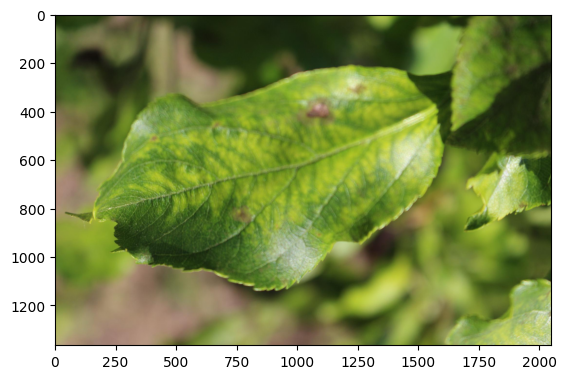

In [41]:
import matplotlib.image as mpimg
# Read Images
img = mpimg.imread('/kaggle/input/plant-pathology-2020-fgvc7/images/Train_0.jpg')
# Output Images
plt.imshow(img)
plt.show()

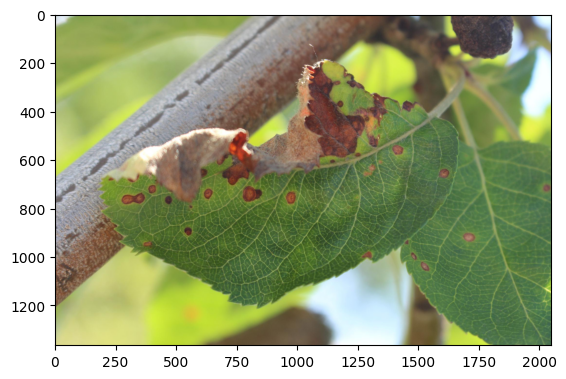

In [15]:
# Read Images
img = mpimg.imread('/kaggle/input/plant-pathology-2020-fgvc7/images/Train_1.jpg')
# Output Images
plt.imshow(img)
plt.show()

In [11]:
img

array([[[ 33,  51,  13],
        [ 33,  51,  13],
        [ 33,  51,  13],
        ...,
        [ 51,  61,  27],
        [ 51,  61,  27],
        [ 51,  61,  27]],

       [[ 33,  51,  13],
        [ 33,  51,  13],
        [ 33,  51,  13],
        ...,
        [ 50,  60,  26],
        [ 50,  60,  26],
        [ 50,  60,  26]],

       [[ 33,  51,  13],
        [ 33,  51,  13],
        [ 33,  51,  13],
        ...,
        [ 50,  60,  26],
        [ 50,  60,  26],
        [ 50,  60,  26]],

       ...,

       [[181, 167, 120],
        [182, 168, 121],
        [182, 168, 121],
        ...,
        [199, 206, 152],
        [197, 202, 148],
        [196, 201, 145]],

       [[181, 167, 120],
        [182, 168, 121],
        [182, 168, 121],
        ...,
        [199, 207, 156],
        [198, 205, 153],
        [202, 206, 155]],

       [[181, 167, 120],
        [182, 168, 121],
        [182, 168, 121],
        ...,
        [205, 213, 164],
        [206, 212, 164],
        [210, 216, 168]]

In [12]:
img.shape

(1365, 2048, 3)

In [13]:
type(img)

numpy.ndarray

In [16]:
np.array([[["test"],["test"]],[["test"],["test"]]]).shape # visualizing 3D array

(2, 2, 1)

## EDA

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1821 entries, 0 to 1820
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   image_id           1821 non-null   object
 1   healthy            1821 non-null   int64 
 2   multiple_diseases  1821 non-null   int64 
 3   rust               1821 non-null   int64 
 4   scab               1821 non-null   int64 
dtypes: int64(4), object(1)
memory usage: 71.3+ KB


In [14]:
df.isna().sum()

image_id             0
healthy              0
multiple_diseases    0
rust                 0
scab                 0
image_data           0
dtype: int64

In [15]:
df.healthy.value_counts()

healthy
0    1305
1     516
Name: count, dtype: int64

In [16]:
healthy_count = df.healthy.value_counts()[1]
multiple_diseases_count = df.multiple_diseases.value_counts()[1]
rust_count = df.rust.value_counts()[1]
scab_count = df.scab.value_counts()[1]
df_counts = pd.DataFrame({"count":[healthy_count,multiple_diseases_count,rust_count,scab_count]},index=["healthy_count","multiple_diseases_count","rust_count","scab_count"])
df_counts

,count
healthy_count,516
multiple_diseases_count,91
rust_count,622
scab_count,592


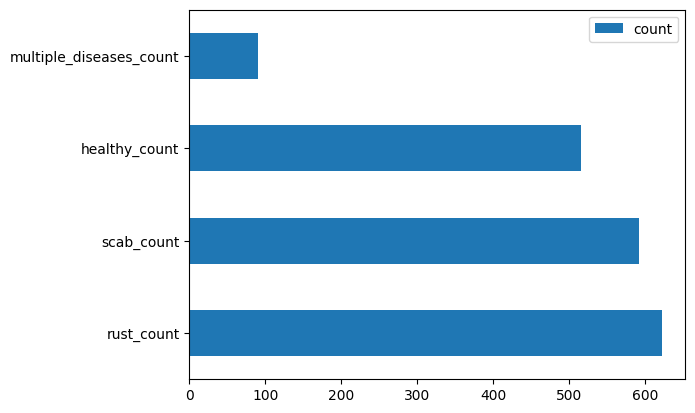

In [17]:
df_counts.sort_values("count",ascending=False).plot.barh()
plt.show()

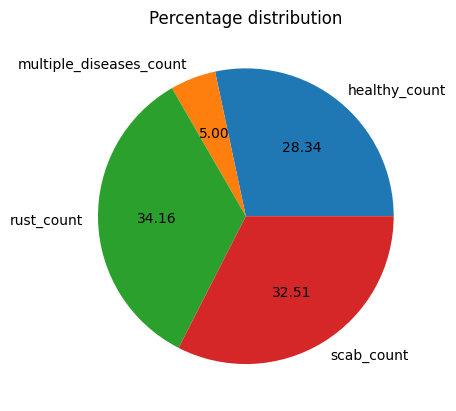

In [18]:
df_counts["count"].plot.pie(autopct="%.2f")
plt.axis('off')
plt.title("Percentage distribution")
plt.show()

In [75]:
scab_image_ids = train_data[train_data.scab==1].sample(6).image_id.values
scab_image_ids = scab_image_ids.reshape(2,3)
scab_image_ids

array([['Train_751', 'Train_820', 'Train_1765'],
       ['Train_372', 'Train_1049', 'Train_1367']], dtype=object)

In [76]:
def show_image_examples(image_ids,plt_title):
    nrows=2
    ncols=3
    fig, axs = plt.subplots(nrows=nrows,ncols=ncols,figsize=(20,10))
    for r in range(nrows):
        for c in range(ncols):
            img = mpimg.imread('/kaggle/input/plant-pathology-2020-fgvc7/images/'+image_ids[r][c]+'.jpg')
            axs[r,c].imshow(img)
            axs[r,c].set_title(image_ids[r][c],fontsize=15)
    fig.suptitle(plt_title,fontsize=22)
    plt.tight_layout()
    plt.show()

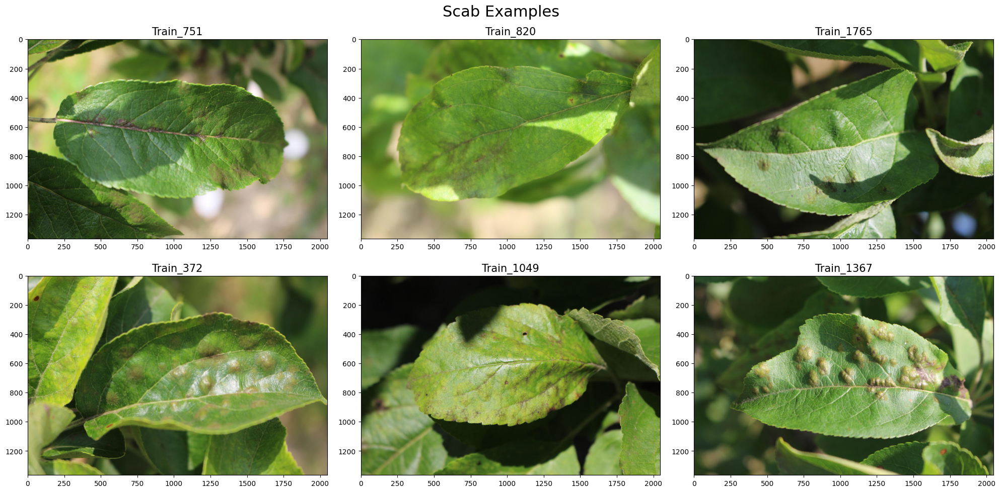

In [77]:
show_image_examples(scab_image_ids,"Scab Examples")

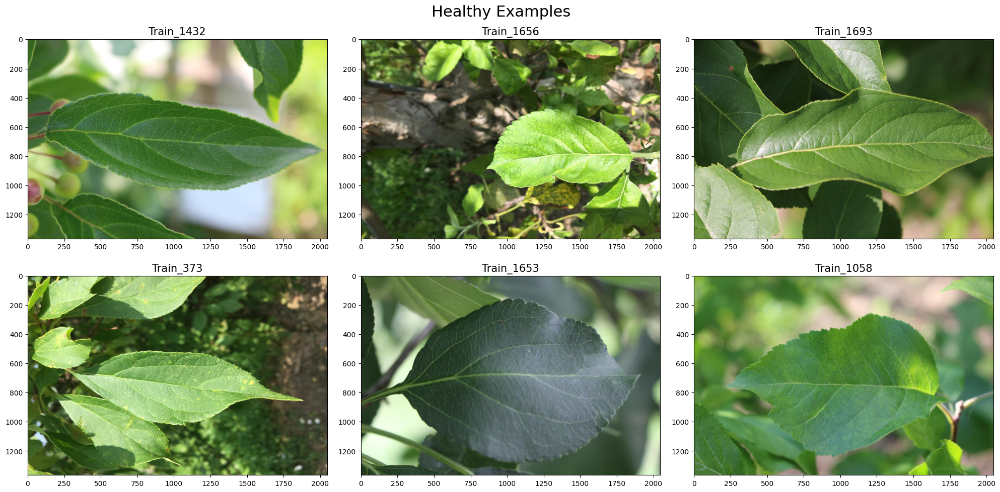

In [78]:
image_ids = train_data[train_data.healthy==1].sample(6).image_id.values
image_ids = image_ids.reshape(2,3)
show_image_examples(image_ids,"Healthy Examples")

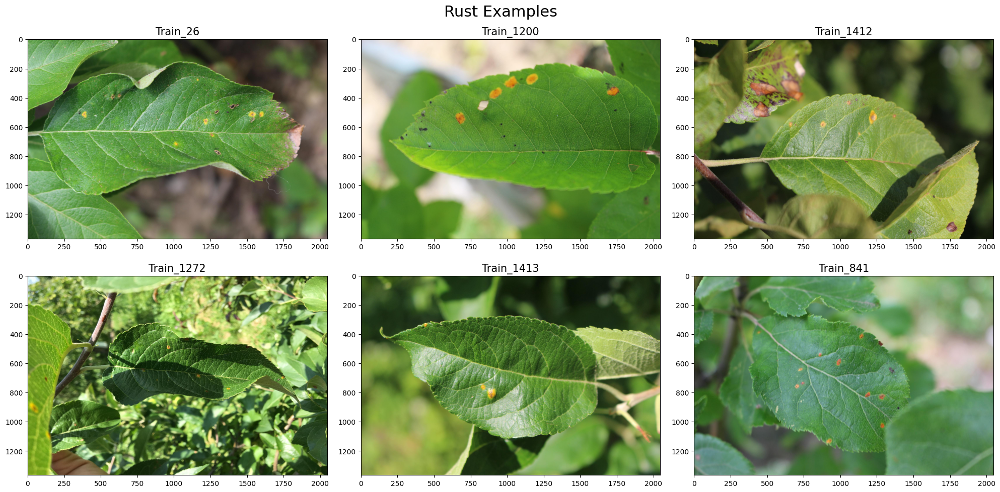

In [79]:
image_ids = train_data[train_data.rust==1].sample(6).image_id.values
image_ids = image_ids.reshape(2,3)
show_image_examples(image_ids,"Rust Examples")

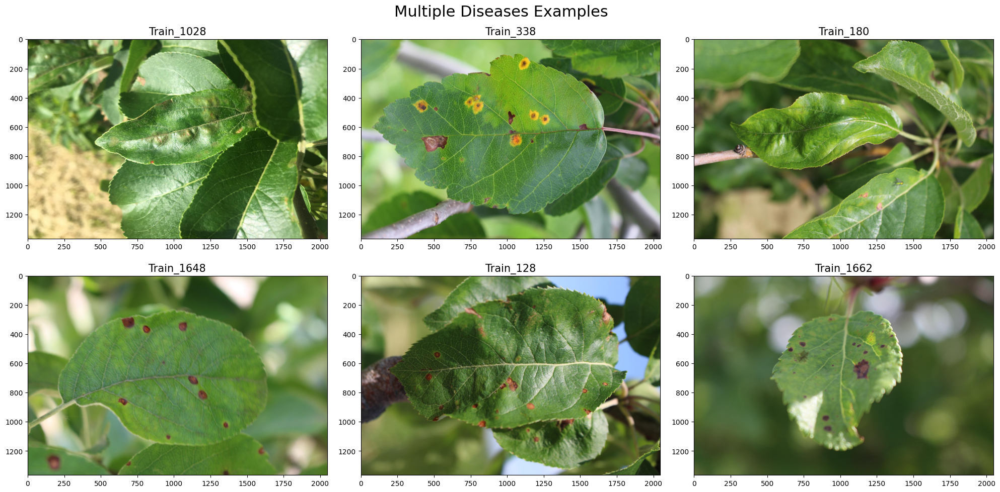

In [81]:
image_ids = train_data[train_data.multiple_diseases==1].sample(6).image_id.values
image_ids = image_ids.reshape(2,3)
show_image_examples(image_ids,"Multiple Diseases Examples")

## Prepare data

### Failed attempt at splitting dataset into train and test

In [18]:
df.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [1]:
array_image_data = []
for i,r in df.iterrows():
    key = r["image_id"]
    img = mpimg.imread(f"/kaggle/input/plant-pathology-2020-fgvc7/images/{key}.jpg")
    if img.shape != (1365, 2048, 3):
        print(key)
    else: array_image_data.append(img)

NameError: name 'df' is not defined

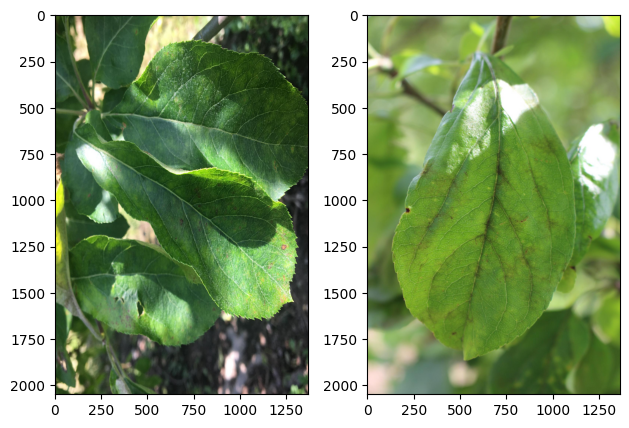

In [14]:
plt.subplot(121)
img = mpimg.imread('..\Data\plant_pathology_apple\images\Train_245.jpg')
plt.imshow(img)
plt.subplot(122)
img = mpimg.imread('..\Data\plant_pathology_apple\images\Train_1156.jpg')
plt.imshow(img)
plt.tight_layout()
plt.show()

In [15]:
df[(df.image_id == "Train_245")|(df.image_id == "Train_1156")]

,image_id,healthy,multiple_diseases,rust,scab
245,Train_245,0,1,0,0
1156,Train_1156,0,0,0,1


In [31]:
df = df.drop([245,1156])

In [32]:
df.reset_index(inplace=True)

In [35]:
df.drop(columns="index",inplace=True)

In [36]:
df.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [ ]:
X = np.stack(array_image_data)
img_rows, img_cols, img_rgb = X[0].shape
X = X.reshape(X.shape[0], img_rows, img_cols, img_rgb)

In [40]:
y = df[["healthy","multiple_diseases","rust","scab"]]

In [43]:
print("X shape:",X.shape)
print("y shape:",y.shape)

X shape: (1819, 1365, 2048, 3)

y shape: (1819, 4)


In [76]:
filter = []
# run in blocks of 10 (182*10 = 1820)
for i in range(182):
    s = set()
    while len(s) < 2:
        s = set(np.random.randint(0, 10, 2, dtype = np.int8))
    a = [x in s for x in range(10)]
    print("a:",a)
    filter.append(a)
    print("len filter:",len(filter))
test = np.array(filter).flatten()
train = np.array([not t for t in test])
print(len(train[train == True]))

a: [False, False, False, False, False, False, True, True, False, False]

len filter: 1

a: [False, False, False, False, False, True, False, True, False, False]

len filter: 2

a: [False, False, False, True, False, False, False, True, False, False]

len filter: 3

a: [False, False, True, False, False, False, False, True, False, False]

len filter: 4

a: [False, False, False, False, False, False, True, True, False, False]

len filter: 5

a: [False, False, False, False, False, True, False, False, False, True]

len filter: 6

a: [False, False, False, True, False, False, False, False, True, False]

len filter: 7

a: [False, False, False, False, False, False, True, False, True, False]

len filter: 8

a: [False, False, False, True, False, True, False, False, False, False]

len filter: 9

a: [False, False, True, False, True, False, False, False, False, False]

len filter: 10

a: [True, False, False, False, False, False, False, True, False, False]

len filter: 11

a: [True, False, False, False,

In [77]:
train = train[:-1]
test = test[:-1]
print(len(train))
print(len(test))

1819

1819


In [78]:
X_train = X[train].copy()
X_test  = X[test].copy()
y_train = y[train].copy()
y_test  = y[test].copy()

MemoryError: Unable to allocate 11.4 GiB for an array with shape (1455, 1365, 2048, 3) and data type uint8

In [74]:
print("X_train.shape:",X_train.shape)
print("X_test.shape:",X_test.shape)
print("y_train.shape):",y_train.shape)
print("y_test.shape:",y_test.shape)

X_train.shape: (1456,)

X_test.shape: (365,)

y_train.shape): (1456, 4)

y_test.shape: (365, 4)


## Modelling

In [10]:
#Setup TPU
AUTO = tf.data.experimental.AUTOTUNE
tpu = tf.distribute.cluster_resolver.TPUClusterResolver()

tf.config.experimental_connect_to_cluster(tpu)
tf.tpu.experimental.initialize_tpu_system(tpu)
strategy = tf.distribute.experimental.TPUStrategy(tpu)

BATCH_SIZE = 16 * strategy.num_replicas_in_sync
GCS_DS_PATH = KaggleDatasets().get_gcs_path()

INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.
INFO:tensorflow:Initializing the TPU system: local
INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)
get_gcs_path is not required on TPU VMs which can directly use Kaggle datasets, using path: /kaggle/input/plant-pathology-2020-fgvc7


In [11]:
#Load labels and paths
def format_path(st):
    return GCS_DS_PATH + '/images/' + st + '.jpg'

test_paths = test_data.image_id.apply(format_path).values
train_paths = train_data.image_id.apply(format_path).values

train_labels = np.float32(train_data.loc[:, 'healthy':'scab'].values)
train_paths, valid_paths, train_labels, valid_labels =\
train_test_split(train_paths, train_labels, test_size=0.15, random_state=2020)

In [ ]:
# decode_image
    # reads image file using filename
    # scaling rgb values to 0 - 1
    # resizing image to size: (512,512)

# data_augment
    # applying random, yet realistic, transformations to the training images, such as rotation and horizontal flipping
    # this helps expose the model to different aspects of the training data and reduce overfitting
    # https://www.tensorflow.org/tutorials/images/transfer_learning#:~:text=A%20pre%2Dtrained%20model%20is,model%20to%20a%20given%20task.

In [12]:
def decode_image(filename, label=None, image_size=(512, 512)):
    bits = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(bits, channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.resize(image, image_size)
    
    if label is None:
        return image
    else:
        return image, label

def data_augment(image, label=None):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    
    if label is None:
        return image
    else:
        return image, label

In [ ]:
# decode_image
    # tf.data.Dataset - Represents a potentially large set of elements
    # from_tensor_slices - This operation preserves the structure of the input tensors, removing the first dimension of each tensor and using it as the dataset dimension 
    # map decode_image
    # map data_augment
    # repeat - indefinitely
    # shuffle - Randomly shuffles the elements of this dataset
    # batch - Combines consecutive elements of this dataset into batches.
    # prefetch - prefetch elements while current is still being processed. This often improves latency and throughput, at the cost of using additional memory to store prefetched elements.

In [13]:
#Create dataset
train_dataset = (
    tf.data.Dataset
    .from_tensor_slices((train_paths, train_labels))
    .map(decode_image, num_parallel_calls=AUTO)
    .map(data_augment, num_parallel_calls=AUTO)
    .repeat()
    .shuffle(512)
    .batch(BATCH_SIZE)
    .prefetch(AUTO)
)

valid_dataset = (
    tf.data.Dataset
    .from_tensor_slices((valid_paths, valid_labels))
    .map(decode_image, num_parallel_calls=AUTO)
    .batch(BATCH_SIZE)
    .cache()
    .prefetch(AUTO)
)

test_dataset = (
    tf.data.Dataset
    .from_tensor_slices(test_paths)
    .map(decode_image, num_parallel_calls=AUTO)
    .batch(BATCH_SIZE)
)

In [ ]:
# Using an LR ramp up because fine-tuning a pre-trained model.
# Starting with a high LR would break the pre-trained weights.

In [14]:
#Helper function
def build_lrfn(lr_start=0.00001, lr_max=0.00005, 
               lr_min=0.00001, lr_rampup_epochs=5, 
               lr_sustain_epochs=0, lr_exp_decay=.8):
    lr_max = lr_max * strategy.num_replicas_in_sync

    def lrfn(epoch):
        if epoch < lr_rampup_epochs:
            lr = (lr_max - lr_start) / lr_rampup_epochs * epoch + lr_start
        elif epoch < lr_rampup_epochs + lr_sustain_epochs:
            lr = lr_max
        else:
            lr = (lr_max - lr_min) *\
                 lr_exp_decay**(epoch - lr_rampup_epochs\
                                - lr_sustain_epochs) + lr_min
        return lr
    return lrfn

In [15]:
#Define hyperparameters and callbacks
lrfn = build_lrfn()
STEPS_PER_EPOCH = train_labels.shape[0] // BATCH_SIZE
lr_schedule = tf.keras.callbacks.LearningRateScheduler(lrfn, verbose=1)

In [47]:
with strategy.scope():
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu', input_shape=(512, 512, 3)))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))
    model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))
    model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(64, activation='relu'))
    model.add(tf.keras.layers.Dense(32, activation='relu'))
    model.add(tf.keras.layers.Dense(4))
    model.compile(optimizer='adam',
          loss = 'categorical_crossentropy',
          metrics=['categorical_accuracy'])
    model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 510, 510, 64)      1792      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 255, 255, 64)     0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 253, 253, 128)     73856     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 126, 126, 128)    0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 124, 124, 128)     147584    
                                                                 
 flatten_1 (Flatten)         (None, 1968128)          

In [48]:
%%time
history = model.fit(train_dataset,
                    epochs=EPOCHS,
                    steps_per_epoch=STEPS_PER_EPOCH,
                    validation_data=valid_dataset)

Epoch 1/20


2023-09-28 17:10:30.880876: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-09-28 17:10:30.969468: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


12/12 [==============================] - ETA: 0s - loss: 2.1801 - categorical_accuracy: 0.3314

2023-09-28 17:11:06.134853: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-09-28 17:11:06.282215: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


12/12 [==============================] - 68s 3s/step - loss: 2.1801 - categorical_accuracy: 0.3314 - val_loss: 15.3533 - val_categorical_accuracy: 0.3431
Epoch 2/20
12/12 [==============================] - 8s 728ms/step - loss: 15.3625 - categorical_accuracy: 0.3307 - val_loss: 15.3533 - val_categorical_accuracy: 0.3431
Epoch 3/20
12/12 [==============================] - 8s 655ms/step - loss: 15.3205 - categorical_accuracy: 0.3060 - val_loss: 15.3533 - val_categorical_accuracy: 0.3431
Epoch 4/20
12/12 [==============================] - 9s 770ms/step - loss: 15.2576 - categorical_accuracy: 0.3301 - val_loss: 15.3533 - val_categorical_accuracy: 0.3431
Epoch 5/20
12/12 [==============================] - 8s 664ms/step - loss: 15.3730 - categorical_accuracy: 0.3288 - val_loss: 15.3533 - val_categorical_accuracy: 0.3431
Epoch 6/20
12/12 [==============================] - 8s 677ms/step - loss: 15.2366 - categorical_accuracy: 0.3092 - val_loss: 15.3533 - val_categorical_accuracy: 0.3431
Epoch 

In [49]:
display_training_curves(
    history.history['categorical_accuracy'], 
    history.history['val_categorical_accuracy'], 
    'accuracy')

In [18]:
#Visualize results
def display_training_curves(training, validation, yaxis):
    if yaxis == "loss":
        ylabel = "Loss"
        title = "Loss vs. Epochs"
    else:
        ylabel = "Accuracy"
        title = "Accuracy vs. Epochs"
        
    fig = go.Figure()
        
    fig.add_trace(
        go.Scatter(x=np.arange(1, EPOCHS+1), mode='lines+markers', y=training, marker=dict(color="dodgerblue"),
               name="Train"))
    
    fig.add_trace(
        go.Scatter(x=np.arange(1, EPOCHS+1), mode='lines+markers', y=validation, marker=dict(color="darkorange"),
               name="Val"))
    
    fig.update_layout(title_text=title, yaxis_title=ylabel, xaxis_title="Epochs", template="plotly_white")
    fig.show()

In [16]:
display_training_curves(
    history.history['categorical_accuracy'], 
    history.history['val_categorical_accuracy'], 
    'accuracy')

In [16]:
#DenseNet
with strategy.scope():
    model = tf.keras.Sequential([DenseNet121(input_shape=(512, 512, 3),
                                             weights='imagenet',
                                             include_top=False),
                                 L.GlobalAveragePooling2D(),
                                 L.Dense(train_labels.shape[1],
                                         activation='softmax')])

    model.compile(optimizer='adam',
              loss = 'categorical_crossentropy',
              metrics=['categorical_accuracy'])
    model.summary()

29084464/29084464 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet121 (Functional)    (None, 16, 16, 1024)      7037504   
                                                                 
 global_average_pooling2d (G  (None, 1024)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 4)                 4100      
                                                                 
Total params: 7,041,604
Trainable params: 6,957,956
Non-trainable params: 83,648
_________________________________________________________________


In [17]:
%%time
history = model.fit(train_dataset,
                    epochs=EPOCHS,
                    callbacks=[lr_schedule],
                    steps_per_epoch=STEPS_PER_EPOCH,
                    validation_data=valid_dataset)


Epoch 1: LearningRateScheduler setting learning rate to 1e-05.
Epoch 1/20


2023-09-28 15:53:51.626720: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-09-28 15:53:53.113612: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


12/12 [==============================] - ETA: 0s - loss: 1.6488 - categorical_accuracy: 0.3613

2023-09-28 15:55:33.956296: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-09-28 15:55:34.315531: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


12/12 [==============================] - 190s 5s/step - loss: 1.6488 - categorical_accuracy: 0.3613 - val_loss: 1.5638 - val_categorical_accuracy: 0.3577 - lr: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 8.8e-05.
Epoch 2/20
12/12 [==============================] - 11s 928ms/step - loss: 0.9588 - categorical_accuracy: 0.6523 - val_loss: 1.1460 - val_categorical_accuracy: 0.5182 - lr: 8.8000e-05

Epoch 3: LearningRateScheduler setting learning rate to 0.000166.
Epoch 3/20
12/12 [==============================] - 10s 806ms/step - loss: 0.3809 - categorical_accuracy: 0.8678 - val_loss: 1.0537 - val_categorical_accuracy: 0.5657 - lr: 1.6600e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000244.
Epoch 4/20
12/12 [==============================] - 10s 819ms/step - loss: 0.2230 - categorical_accuracy: 0.9193 - val_loss: 1.0985 - val_categorical_accuracy: 0.6752 - lr: 2.4400e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.000322.
Epoch 5/20

In [19]:
display_training_curves(
    history.history['categorical_accuracy'], 
    history.history['val_categorical_accuracy'], 
    'accuracy')

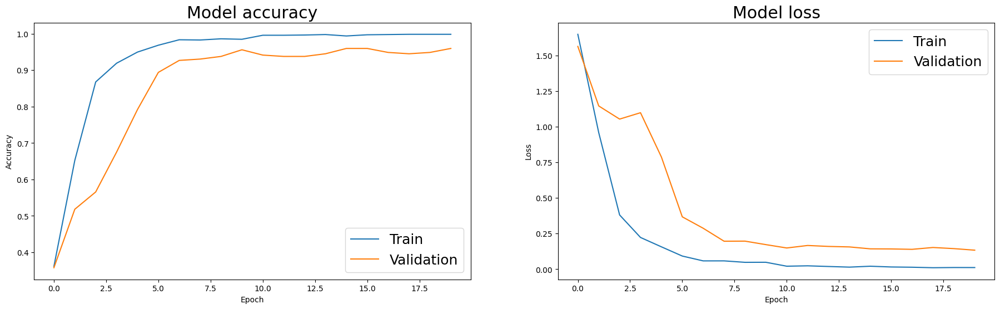

In [20]:
fig, ax = plt.subplots(1, 2, figsize = (18, 6))
fig.subplots_adjust(left = 0.02, right = 0.98, wspace = 0.2)

plt.rcParams.update({'font.size': 18})

# Plot training & validation accuracy values
ax[0].plot(history.history['categorical_accuracy'])
ax[0].plot(history.history['val_categorical_accuracy'])
ax[0].set_title('Model accuracy')
ax[0].set_ylabel('Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].legend(['Train', 'Validation'])

# Plot training & validation loss values
ax[1].plot(history.history['loss'])
ax[1].plot(history.history['val_loss'])
ax[1].set_title('Model loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epoch')
ax[1].legend(['Train', 'Validation'])

plt.show()

In [21]:
def process(img):
    return cv2.resize(img/255.0, (512, 512)).reshape(-1, 512, 512, 3)
def predict(img):
    return model.layers[2](model.layers[1](model.layers[0](process(img)))).numpy()[0]

fig = make_subplots(rows=4, cols=2)
preds = predict(train_images[2])

colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Scab"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Multiple diseases"

colors[pred] = px.colors.qualitative.Plotly[1]
colors["Healthy"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[2], (205, 136))), row=1, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=1, col=2)
fig.update_layout(height=1200, width=800, title_text="DenseNet Predictions", showlegend=False)

preds = predict(train_images[0])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Multiple diseases"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[0], (205, 136))), row=2, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=2, col=2)

preds = predict(train_images[3])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Rust"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[3], (205, 136))), row=3, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=3, col=2)

preds = predict(train_images[1])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Scab"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[1], (205, 136))), row=4, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=4, col=2)

fig.update_layout(template="plotly_white")

In [50]:
model.save('/kaggle/working/denseNet_plant_pathology.keras')

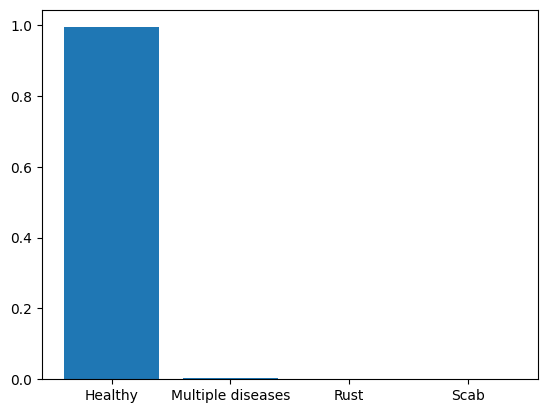

In [51]:
preds = model.layers[2](model.layers[1](model.layers[0](process(train_images[2])))).numpy()[0]
plt.bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], height=preds)
plt.show()

In [48]:
train_images

0     [[[33, 51, 13], [33, 51, 13], [33, 51, 13], [3...
1     [[[203, 215, 215], [203, 215, 215], [204, 216,...
2     [[[120, 124, 109], [120, 124, 109], [121, 125,...
3     [[[103, 138, 70], [103, 138, 70], [103, 138, 7...
4     [[[77, 141, 47], [77, 141, 47], [76, 140, 46],...
                            ...                        
95    [[[110, 150, 115], [110, 150, 115], [110, 150,...
96    [[[27, 49, 28], [27, 49, 28], [27, 49, 28], [2...
97    [[[102, 133, 99], [102, 133, 99], [102, 133, 9...
98    [[[227, 228, 212], [228, 229, 213], [228, 230,...
99    [[[61, 83, 37], [61, 83, 37], [62, 84, 38], [6...
Name: image_id, Length: 100, dtype: object

In [35]:
%%time
probs = model.predict(train_dataset,steps=14.2265625)

14/14 [==============================] - 12s 639ms/step
CPU times: user 3min 57s, sys: 1min 55s, total: 5min 52s
Wall time: 12.3 s


In [28]:
train_data.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [37]:
probs.shape

(1920, 4)

In [22]:
#ResNet50
with strategy.scope():
    model = tf.keras.Sequential([ResNet50(input_shape=(512, 512, 3),
                                             weights='imagenet',
                                             include_top=False),
                                 L.GlobalAveragePooling2D(),
                                 L.Dense(train_labels.shape[1],
                                         activation='softmax')])

    model.compile(optimizer='adam',
              loss = 'categorical_crossentropy',
              metrics=['categorical_accuracy'])
    model.summary()

94765736/94765736 [==============================] - 1s 0us/step
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 16, 16, 2048)      23587712  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_1 (Dense)             (None, 4)                 8196      
                                                                 
Total params: 23,595,908
Trainable params: 23,542,788
Non-trainable params: 53,120
_________________________________________________________________


In [23]:
%%time
history = model.fit(train_dataset,
                    epochs=EPOCHS,
                    callbacks=[lr_schedule],
                    steps_per_epoch=STEPS_PER_EPOCH,
                    validation_data=valid_dataset)


Epoch 1: LearningRateScheduler setting learning rate to 1e-05.
Epoch 1/20


2023-09-28 16:01:41.418461: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-09-28 16:01:42.204677: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


12/12 [==============================] - ETA: 0s - loss: 1.3139 - categorical_accuracy: 0.4030

2023-09-28 16:02:33.389014: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-09-28 16:02:33.616128: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


12/12 [==============================] - 105s 3s/step - loss: 1.3139 - categorical_accuracy: 0.4030 - val_loss: 1.9979 - val_categorical_accuracy: 0.2774 - lr: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 8.8e-05.
Epoch 2/20
12/12 [==============================] - 8s 725ms/step - loss: 0.5936 - categorical_accuracy: 0.7982 - val_loss: 3.5212 - val_categorical_accuracy: 0.2774 - lr: 8.8000e-05

Epoch 3: LearningRateScheduler setting learning rate to 0.000166.
Epoch 3/20
12/12 [==============================] - 8s 708ms/step - loss: 0.2769 - categorical_accuracy: 0.9160 - val_loss: 2.4990 - val_categorical_accuracy: 0.2774 - lr: 1.6600e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000244.
Epoch 4/20
12/12 [==============================] - 9s 727ms/step - loss: 0.1895 - categorical_accuracy: 0.9447 - val_loss: 3.3079 - val_categorical_accuracy: 0.2774 - lr: 2.4400e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.000322.
Epoch 5/20
12

In [24]:
display_training_curves(
    history.history['categorical_accuracy'], 
    history.history['val_categorical_accuracy'], 
    'accuracy')

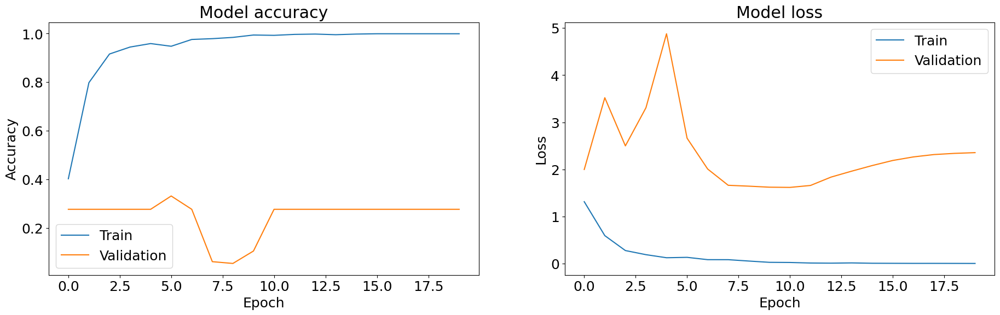

In [26]:
fig, ax = plt.subplots(1, 2, figsize = (18, 6))
fig.subplots_adjust(left = 0.02, right = 0.98, wspace = 0.2)

plt.rcParams.update({'font.size': 18})

# Plot training & validation accuracy values
ax[0].plot(history.history['categorical_accuracy'])
ax[0].plot(history.history['val_categorical_accuracy'])
ax[0].set_title('Model accuracy')
ax[0].set_ylabel('Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].legend(['Train', 'Validation'])

# Plot training & validation loss values
ax[1].plot(history.history['loss'])
ax[1].plot(history.history['val_loss'])
ax[1].set_title('Model loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epoch')
ax[1].legend(['Train', 'Validation'])

plt.show()

In [27]:
model.layers[2](model.layers[1](model.layers[0](process(train_images[2])))).numpy()[0]

array([0.7984449 , 0.08046392, 0.04326216, 0.07782898], dtype=float32)

In [28]:
model.layers[2](model.layers[1](model.layers[0](process(train_images[3])))).numpy()[0]

array([0.8370661 , 0.05274685, 0.03526505, 0.07492187], dtype=float32)

In [29]:
model.layers[2](model.layers[1](model.layers[0](process(train_images[1])))).numpy()[0]

array([0.88482267, 0.02467343, 0.02622657, 0.06427741], dtype=float32)

In [20]:
model.save('/kaggle/working/ResNet50_plant_pathology.keras')

In [36]:
#EfficientNet
with strategy.scope():
    model = tf.keras.Sequential([efn.EfficientNetB7(input_shape=(512, 512, 3),
                                                    weights='imagenet',
                                                    include_top=False),
                                 L.GlobalAveragePooling2D(),
                                 L.Dense(train_labels.shape[1],
                                         activation='softmax')])

    model.compile(optimizer='adam',
              loss = 'categorical_crossentropy',
              metrics=['categorical_accuracy'])
    model.summary()

258434480/258434480 [==============================] - 2s 0us/step
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnet-b7 (Functional  (None, 16, 16, 2560)     64097680  
 )                                                               
                                                                 
 global_average_pooling2d_3   (None, 2560)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_3 (Dense)             (None, 4)                 10244     
                                                                 
Total params: 64,107,924
Trainable params: 63,797,204
Non-trainable params: 310,720
_________________________________________________________________


In [37]:
%%time
history = model.fit(train_dataset,
                    epochs=EPOCHS,
                    callbacks=[lr_schedule],
                    steps_per_epoch=STEPS_PER_EPOCH,
                    validation_data=valid_dataset)


Epoch 1: LearningRateScheduler setting learning rate to 1e-05.
Epoch 1/20


2023-09-28 16:36:12.960319: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-09-28 16:36:16.469676: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


12/12 [==============================] - ETA: 0s - loss: 1.3798 - categorical_accuracy: 0.2949

2023-09-28 16:40:51.222391: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-09-28 16:40:51.850570: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


12/12 [==============================] - 438s 7s/step - loss: 1.3798 - categorical_accuracy: 0.2949 - val_loss: 1.4163 - val_categorical_accuracy: 0.2226 - lr: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 8.8e-05.
Epoch 2/20
12/12 [==============================] - 16s 1s/step - loss: 1.1685 - categorical_accuracy: 0.6270 - val_loss: 1.1699 - val_categorical_accuracy: 0.5693 - lr: 8.8000e-05

Epoch 3: LearningRateScheduler setting learning rate to 0.000166.
Epoch 3/20
12/12 [==============================] - 16s 1s/step - loss: 0.5692 - categorical_accuracy: 0.8516 - val_loss: 0.7423 - val_categorical_accuracy: 0.7774 - lr: 1.6600e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000244.
Epoch 4/20
12/12 [==============================] - 16s 1s/step - loss: 0.3020 - categorical_accuracy: 0.9095 - val_loss: 0.4729 - val_categorical_accuracy: 0.8540 - lr: 2.4400e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.000322.
Epoch 5/20
12/12 [=

In [38]:
display_training_curves(
    history.history['categorical_accuracy'], 
    history.history['val_categorical_accuracy'], 
    'accuracy')

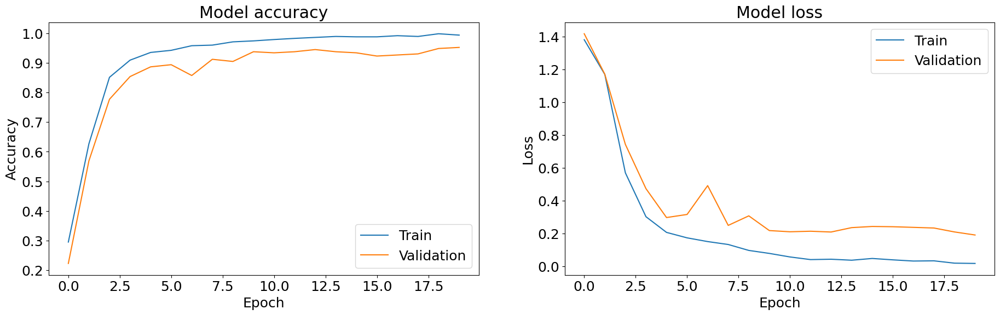

In [39]:
fig, ax = plt.subplots(1, 2, figsize = (18, 6))
fig.subplots_adjust(left = 0.02, right = 0.98, wspace = 0.2)

plt.rcParams.update({'font.size': 18})

# Plot training & validation accuracy values
ax[0].plot(history.history['categorical_accuracy'])
ax[0].plot(history.history['val_categorical_accuracy'])
ax[0].set_title('Model accuracy')
ax[0].set_ylabel('Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].legend(['Train', 'Validation'])

# Plot training & validation loss values
ax[1].plot(history.history['loss'])
ax[1].plot(history.history['val_loss'])
ax[1].set_title('Model loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epoch')
ax[1].legend(['Train', 'Validation'])

plt.show()

In [24]:
model.save('/kaggle/working/EfficientNet_plant_pathology.keras')

In [25]:
with strategy.scope():
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu', input_shape=(512, 512, 3)))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))
    model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2)))
    model.add(tf.keras.layers.Conv2D(256, (3, 3), activation='relu'))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(128, activation='relu'))
    model.add(tf.keras.layers.Dense(64, activation='relu'))
    model.add(tf.keras.layers.Dense(32, activation='relu'))
    model.add(tf.keras.layers.Dense(4))
    model.compile(optimizer='adam',
          loss = 'categorical_crossentropy',
          metrics=['categorical_accuracy'])
    model.summary()


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 510, 510, 64)      1792      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 255, 255, 64)     0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 253, 253, 128)     73856     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 126, 126, 128)    0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 124, 124, 256)     295168    
                                                                 
 flatten_1 (Flatten)         (None, 3936256)          

In [26]:
%%time
history = model.fit(train_dataset,
                    epochs=EPOCHS,
                    callbacks=[lr_schedule],
                    steps_per_epoch=STEPS_PER_EPOCH,
                    validation_data=valid_dataset)


Epoch 1: LearningRateScheduler setting learning rate to 1e-05.
Epoch 1/20


2023-09-28 14:04:56.218679: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-09-28 14:04:56.305300: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


12/12 [==============================] - ETA: 0s - loss: 7.8115 - categorical_accuracy: 0.3470

2023-09-28 14:06:02.479742: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-09-28 14:06:02.584850: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


12/12 [==============================] - 127s 6s/step - loss: 7.8114 - categorical_accuracy: 0.3470 - val_loss: 10.7650 - val_categorical_accuracy: 0.3321 - lr: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 8.8e-05.
Epoch 2/20
12/12 [==============================] - 8s 688ms/step - loss: 10.5040 - categorical_accuracy: 0.3483 - val_loss: 10.7650 - val_categorical_accuracy: 0.3321 - lr: 8.8000e-05

Epoch 3: LearningRateScheduler setting learning rate to 0.000166.
Epoch 3/20
12/12 [==============================] - 8s 695ms/step - loss: 10.6404 - categorical_accuracy: 0.3398 - val_loss: 10.7650 - val_categorical_accuracy: 0.3321 - lr: 1.6600e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000244.
Epoch 4/20
12/12 [==============================] - 9s 757ms/step - loss: 10.5250 - categorical_accuracy: 0.3470 - val_loss: 10.7650 - val_categorical_accuracy: 0.3321 - lr: 2.4400e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.000322.
Epoch 

In [27]:
display_training_curves(
    history.history['categorical_accuracy'], 
    history.history['val_categorical_accuracy'], 
    'accuracy')

In [31]:
#EfficientNet
with strategy.scope():
    model = tf.keras.Sequential([EfficientNetB7(input_shape=(512, 512, 3),
                                                    weights='imagenet',
                                                    include_top=False),
                                 L.GlobalAveragePooling2D(),
                                 L.Dense(train_labels.shape[1],
                                         activation='softmax')])
    
    model.compile(optimizer='adam',
                  loss = 'categorical_crossentropy',
                  metrics=['categorical_accuracy'])
    model.summary()

258076736/258076736 [==============================] - 2s 0us/step
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb7 (Functional)  (None, 16, 16, 2560)     64097687  
                                                                 
 global_average_pooling2d_2   (None, 2560)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_2 (Dense)             (None, 4)                 10244     
                                                                 
Total params: 64,107,931
Trainable params: 63,797,204
Non-trainable params: 310,727
_________________________________________________________________


In [32]:
%%time
history = model.fit(train_dataset,
                    epochs=EPOCHS,
                    callbacks=[lr_schedule],
                    steps_per_epoch=STEPS_PER_EPOCH,
                    validation_data=valid_dataset)


Epoch 1: LearningRateScheduler setting learning rate to 1e-05.
Epoch 1/20


2023-09-28 16:15:24.396934: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-09-28 16:15:28.345322: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


12/12 [==============================] - ETA: 0s - loss: 1.4047 - categorical_accuracy: 0.2520

2023-09-28 16:20:06.247383: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-09-28 16:20:06.872137: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


12/12 [==============================] - 442s 7s/step - loss: 1.4047 - categorical_accuracy: 0.2520 - val_loss: 1.3911 - val_categorical_accuracy: 0.3504 - lr: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 8.8e-05.
Epoch 2/20
12/12 [==============================] - 16s 1s/step - loss: 1.2273 - categorical_accuracy: 0.5091 - val_loss: 1.4264 - val_categorical_accuracy: 0.2664 - lr: 8.8000e-05

Epoch 3: LearningRateScheduler setting learning rate to 0.000166.
Epoch 3/20
12/12 [==============================] - 16s 1s/step - loss: 0.8431 - categorical_accuracy: 0.6940 - val_loss: 1.4395 - val_categorical_accuracy: 0.2774 - lr: 1.6600e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000244.
Epoch 4/20
12/12 [==============================] - 16s 1s/step - loss: 0.5641 - categorical_accuracy: 0.7891 - val_loss: 1.4274 - val_categorical_accuracy: 0.2774 - lr: 2.4400e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.000322.
Epoch 5/20
12/12 [=

In [33]:
display_training_curves(
    history.history['categorical_accuracy'], 
    history.history['val_categorical_accuracy'], 
    'accuracy')

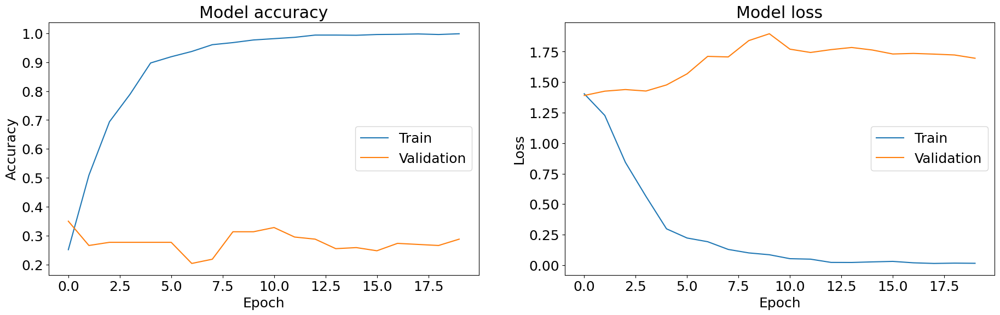

In [34]:
fig, ax = plt.subplots(1, 2, figsize = (18, 6))
fig.subplots_adjust(left = 0.02, right = 0.98, wspace = 0.2)

plt.rcParams.update({'font.size': 18})

# Plot training & validation accuracy values
ax[0].plot(history.history['categorical_accuracy'])
ax[0].plot(history.history['val_categorical_accuracy'])
ax[0].set_title('Model accuracy')
ax[0].set_ylabel('Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].legend(['Train', 'Validation'])

# Plot training & validation loss values
ax[1].plot(history.history['loss'])
ax[1].plot(history.history['val_loss'])
ax[1].set_title('Model loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epoch')
ax[1].legend(['Train', 'Validation'])

plt.show()

In [40]:
with strategy.scope():
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Conv2D(1024, (3, 3), activation='relu', input_shape=(512, 512, 3)))
    model.add(tf.keras.layers.GlobalAveragePooling2D())
    model.add(tf.keras.layers.Dense(4,activation="softmax"))
    model.compile(optimizer='adam',
          loss = 'categorical_crossentropy',
          metrics=['categorical_accuracy'])
    model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 510, 510, 1024)    28672     
                                                                 
 global_average_pooling2d_4   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_4 (Dense)             (None, 4)                 4100      
                                                                 
Total params: 32,772
Trainable params: 32,772
Non-trainable params: 0
_________________________________________________________________


In [41]:
%%time
history = model.fit(train_dataset,
                    epochs=EPOCHS,
                    callbacks=[lr_schedule],
                    steps_per_epoch=STEPS_PER_EPOCH,
                    validation_data=valid_dataset)


Epoch 1: LearningRateScheduler setting learning rate to 1e-05.
Epoch 1/20


2023-09-28 16:49:40.395290: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-09-28 16:49:40.449345: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


12/12 [==============================] - ETA: 0s - loss: 1.3941 - categorical_accuracy: 0.0540

2023-09-28 16:49:59.018498: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-09-28 16:49:59.117696: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


12/12 [==============================] - 29s 2s/step - loss: 1.3941 - categorical_accuracy: 0.0540 - val_loss: 1.3978 - val_categorical_accuracy: 0.0474 - lr: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 8.8e-05.
Epoch 2/20
12/12 [==============================] - 10s 816ms/step - loss: 1.4169 - categorical_accuracy: 0.0566 - val_loss: 1.4478 - val_categorical_accuracy: 0.0474 - lr: 8.8000e-05

Epoch 3: LearningRateScheduler setting learning rate to 0.000166.
Epoch 3/20
12/12 [==============================] - 11s 944ms/step - loss: 1.5008 - categorical_accuracy: 0.0462 - val_loss: 1.5731 - val_categorical_accuracy: 0.0474 - lr: 1.6600e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000244.
Epoch 4/20
12/12 [==============================] - 10s 850ms/step - loss: 1.6610 - categorical_accuracy: 0.0508 - val_loss: 1.7722 - val_categorical_accuracy: 0.0474 - lr: 2.4400e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.000322.
Epoch 5/20


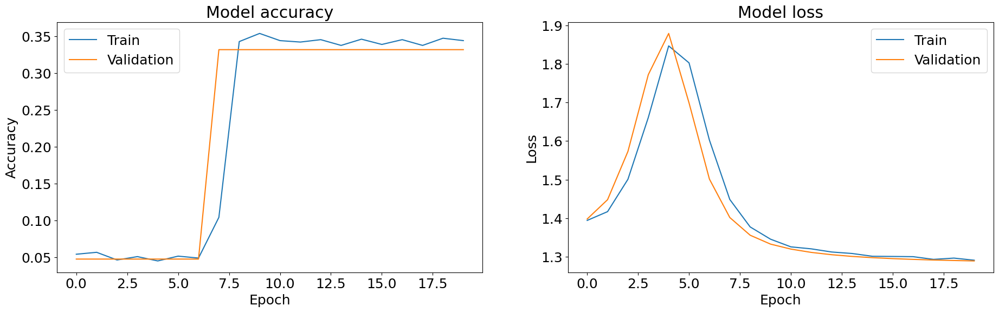

In [42]:
fig, ax = plt.subplots(1, 2, figsize = (18, 6))
fig.subplots_adjust(left = 0.02, right = 0.98, wspace = 0.2)

plt.rcParams.update({'font.size': 18})

# Plot training & validation accuracy values
ax[0].plot(history.history['categorical_accuracy'])
ax[0].plot(history.history['val_categorical_accuracy'])
ax[0].set_title('Model accuracy')
ax[0].set_ylabel('Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].legend(['Train', 'Validation'])

# Plot training & validation loss values
ax[1].plot(history.history['loss'])
ax[1].plot(history.history['val_loss'])
ax[1].set_title('Model loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epoch')
ax[1].legend(['Train', 'Validation'])

plt.show()

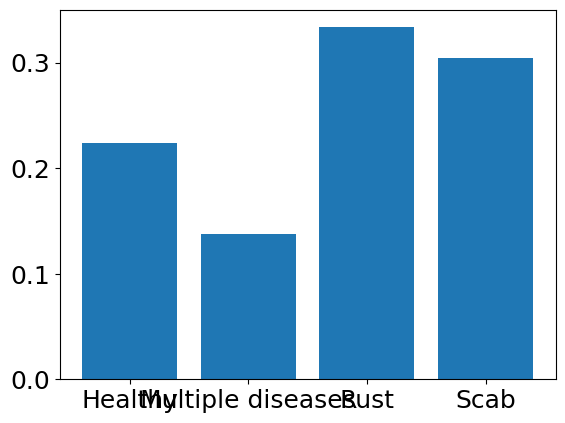

In [43]:
preds = model.layers[2](model.layers[1](model.layers[0](process(train_images[2])))).numpy()[0]
plt.bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], height=preds)
plt.show()

## Appendix

In [3]:
import numpy as np
import pandas as pd
import os
import random, re, math
import tensorflow as tf, tensorflow.keras.backend as K
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers
from kaggle_datasets import KaggleDatasets

import matplotlib.pyplot as plt

print(tf.__version__)
print(tf.keras.__version__)

2.12.0
2.12.0


In [2]:
AUTO = tf.data.experimental.AUTOTUNE
# Detect hardware, return appropriate distribution strategy
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection. No parameters necessary if TPU_NAME environment variable is set. On Kaggle this is always the case.
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    strategy = tf.distribute.get_strategy() # default distribution strategy in Tensorflow. Works on CPU and single GPU.

print("REPLICAS: ", strategy.num_replicas_in_sync)


# Data access
GCS_DS_PATH = KaggleDatasets().get_gcs_path()

Running on TPU  
INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.
INFO:tensorflow:Initializing the TPU system: local
INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


REPLICAS:  8


get_gcs_path is not required on TPU VMs which can directly use Kaggle datasets, using path: /kaggle/input/plant-pathology-2020-fgvc7


In [3]:
!pip install efficientnet
import efficientnet.tfkeras as efn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.9/13.9 MB 53.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 220.9/220.9 kB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 67.7 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.2/313.2 kB 20.0 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.0.1 -> 23.2.1
[notice] To update, run: pip install --upgrade pip


In [4]:
path='../input/plant-pathology-2020-fgvc7/'
train = pd.read_csv(path + 'train.csv')
test = pd.read_csv(path + 'test.csv')
sub = pd.read_csv(path + 'sample_submission.csv')

train_paths = train.image_id.apply(lambda x: GCS_DS_PATH + '/images/' + x + '.jpg').values
test_paths = test.image_id.apply(lambda x: GCS_DS_PATH + '/images/' + x + '.jpg').values

train_labels = train.loc[:, 'healthy':].values

In [5]:
nb_classes = 4
BATCH_SIZE = 8 * strategy.num_replicas_in_sync
img_size = 768
EPOCHS = 40

In [6]:
def decode_image(filename, label=None, image_size=(img_size, img_size)):
    bits = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(bits, channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.resize(image, image_size)
    if label is None:
        return image
    else:
        return image, label
    
def data_augment(image, label=None, seed=2020):
    image = tf.image.random_flip_left_right(image, seed=seed)
    image = tf.image.random_flip_up_down(image, seed=seed)
           
    if label is None:
        return image
    else:
        return image, label

In [7]:
train_dataset = (
    tf.data.Dataset
    .from_tensor_slices((train_paths, train_labels))
    .map(decode_image, num_parallel_calls=AUTO)
    .map(data_augment, num_parallel_calls=AUTO)
    .repeat()
    .shuffle(512)
    .batch(BATCH_SIZE)
    .prefetch(AUTO)
    )

In [8]:
test_dataset = (
    tf.data.Dataset
    .from_tensor_slices(test_paths)
    .map(decode_image, num_parallel_calls=AUTO)
    .batch(BATCH_SIZE)
)

Learning rate schedule: 1e-05 to 0.0008 to 1.73e-05


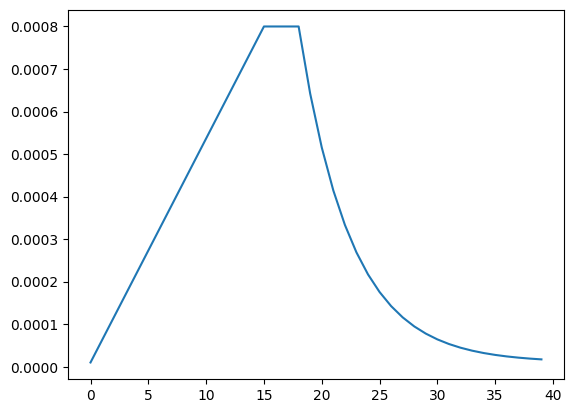

In [9]:
LR_START = 0.00001
LR_MAX = 0.0001 * strategy.num_replicas_in_sync
LR_MIN = 0.00001
LR_RAMPUP_EPOCHS = 15
LR_SUSTAIN_EPOCHS = 3
LR_EXP_DECAY = .8

def lrfn(epoch):
    if epoch < LR_RAMPUP_EPOCHS:
        lr = (LR_MAX - LR_START) / LR_RAMPUP_EPOCHS * epoch + LR_START
    elif epoch < LR_RAMPUP_EPOCHS + LR_SUSTAIN_EPOCHS:
        lr = LR_MAX
    else:
        lr = (LR_MAX - LR_MIN) * LR_EXP_DECAY**(epoch - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS) + LR_MIN
    return lr
    
lr_callback = tf.keras.callbacks.LearningRateScheduler(lrfn, verbose=True)

rng = [i for i in range(EPOCHS)]
y = [lrfn(x) for x in rng]
plt.plot(rng, y)
print("Learning rate schedule: {:.3g} to {:.3g} to {:.3g}".format(y[0], max(y), y[-1]))

In [10]:
def get_model():
    base_model =  efn.EfficientNetB7(weights='imagenet', include_top=False, pooling='avg', input_shape=(img_size, img_size, 3))
    x = base_model.output
    predictions = Dense(nb_classes, activation="softmax")(x)
    return Model(inputs=base_model.input, outputs=predictions)

In [11]:
with strategy.scope():
    model = get_model()
    
model.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['accuracy'])

258434480/258434480 [==============================] - 2s 0us/step


In [12]:
%%time
model.fit(
    train_dataset, 
    steps_per_epoch=train_labels.shape[0] // BATCH_SIZE,
    callbacks=[lr_callback],
    epochs=EPOCHS
)


Epoch 1: LearningRateScheduler setting learning rate to 1e-05.
Epoch 1/40


2023-09-27 10:21:41.585269: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-09-27 10:21:44.894894: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


28/28 [==============================] - 362s 1s/step - loss: 1.3546 - accuracy: 0.3811 - lr: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 6.266666666666667e-05.
Epoch 2/40
28/28 [==============================] - 39s 1s/step - loss: 0.9599 - accuracy: 0.7388 - lr: 6.2667e-05

Epoch 3: LearningRateScheduler setting learning rate to 0.00011533333333333334.
Epoch 3/40
28/28 [==============================] - 38s 1s/step - loss: 0.3928 - accuracy: 0.8834 - lr: 1.1533e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.000168.
Epoch 4/40
28/28 [==============================] - 39s 1s/step - loss: 0.2979 - accuracy: 0.9129 - lr: 1.6800e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.00022066666666666667.
Epoch 5/40
28/28 [==============================] - 39s 1s/step - loss: 0.2606 - accuracy: 0.9107 - lr: 2.2067e-04

Epoch 6: LearningRateScheduler setting learning rate to 0.0002733333333333334.
Epoch 6/40
28/28 [============================

In [13]:
%%time
probs = model.predict(test_dataset)

2023-09-27 10:52:15.628777: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-09-27 10:52:16.196148: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


29/29 [==============================] - 85s 2s/step
CPU times: user 8min 17s, sys: 2min 52s, total: 11min 10s
Wall time: 1min 25s


In [14]:
sub.loc[:, 'healthy':] = probs
sub.to_csv('submission.csv', index=False)
sub.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Test_0,3.745618e-07,3.235925e-05,9.999669e-01,3.642493e-07
1,Test_1,3.909307e-09,1.241375e-05,9.999875e-01,1.724531e-07
2,Test_2,1.812154e-08,1.054388e-07,1.184405e-07,9.999998e-01
3,Test_3,9.999926e-01,1.896856e-07,4.648492e-06,2.560143e-06
4,Test_4,1.195105e-06,1.797104e-04,9.998156e-01,3.449916e-06
